In [1]:
#import the necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import json 
import seaborn

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
#load the .csv filed
annotation_data_frame = pd.read_csv('/Users/mirandahulsey-vincent/Documents/allPythonCode/syntax_analysis/database.csv')

### Data cleaning: convert from a .csv file into a neatly-labeled table. Include the following information for each recording:
    - Animal ID
    - Date of recording (MM.DD)
    - Hour of recording
    - Minute of recording
    - Second of recording
    - Columns for each syllable type in the data, with timeframes of the label for each row of recording

In [3]:
import pandas as pd
import json

# Function to extract date and time from the file name
def find_recording_dates_and_times(recording_file_path_name):
    try:
        # Split the full path to isolate the file name
        split_path_by_dashes = recording_file_path_name.split('/')
        file_name = split_path_by_dashes[-1]
        
        # Split the file name by underscores to extract relevant parts
        split_file_name_by_underscores = file_name.split('_')
        
        # Extract animal ID
        animal_id = split_file_name_by_underscores[0]
        
        # Extract month and ensure it has two digits
        month = split_file_name_by_underscores[2]
        if int(month) < 10:
            month = '0' + month
        
        # Extract day and ensure it has two digits
        day = split_file_name_by_underscores[3]
        if int(day) < 10:
            day = '0' + day
        
        # Combine month and day to form the date in MM.DD format
        date = month + '.' + day
        
        # Extract time components
        hour = split_file_name_by_underscores[4]
        minute = split_file_name_by_underscores[5]
        
        # Extract seconds and remove the file extension
        second = split_file_name_by_underscores[6][0:-4]  # Removes '.wav'
        
        return animal_id, date, hour, minute, second

    except IndexError:
        # Handle cases where the file name format is unexpected
        print(f"Error: Unexpected format in file name {recording_file_path_name}")
        return None, None, None, None, None

    except Exception as e:
        # Handle any other unexpected errors
        print(f"Error processing file {recording_file_path_name}: {e}")
        return None, None, None, None, None

# Function to find the number of unique syllable labels
def find_unique_labels(data_frame):
    unique_labels = set()
    
    # Iterate through the 'Annotations' column
    for annotations in data_frame['Annotations']:
        if annotations is not None:  # Check if the entry is not None
            # Convert the JSON string to a dictionary
            annotations_dict = json.loads(annotations)
            
            # Add the keys (labels) from the dictionary to the set
            unique_labels.update(annotations_dict.keys())
    
    total_unique_labels = len(unique_labels)
    return total_unique_labels, unique_labels

# Function to find the number of different days
def find_unique_days(data_frame):
    unique_dates = data_frame['Date'].unique()  # Extract unique dates
    number_of_unique_days = len(unique_dates)   # Count the number of unique dates
    return number_of_unique_days, unique_dates

# Function to create a table from the DataFrame and find unique labels and days
def make_table(input_data_frame):
    # Filter and reset index
    only_song_data = input_data_frame[input_data_frame['song_present'] == True].reset_index(drop=True)
    num_files_with_song = only_song_data.shape[0]   

    # Initialize organized DataFrame
    organized_data_frame = pd.DataFrame({'Animal ID': [None] * num_files_with_song,
                                         'Date': [None] * num_files_with_song,
                                         'Hour': [None] * num_files_with_song,
                                         'Minute': [None] * num_files_with_song,
                                         'Second': [None] * num_files_with_song,
                                         'Annotations': [None] * num_files_with_song})

    for i, row in only_song_data.iterrows():
        recording_file_path_name = row['file_name']
        try:
            animal_id, date, hour, minute, second = find_recording_dates_and_times(recording_file_path_name)
            organized_data_frame.at[i, 'Animal ID'] = animal_id
            organized_data_frame.at[i, 'Date'] = date
            organized_data_frame.at[i, 'Hour'] = hour
            organized_data_frame.at[i, 'Minute'] = minute
            organized_data_frame.at[i, 'Second'] = second
        except Exception as e:
            # Log the error and continue, or set these to a default value
            print(f"Error processing file {recording_file_path_name}: {e}")
            continue
        # Handle annotations safely
        organized_data_frame.at[i, 'Annotations'] = row.get('syllable_onsets/offsets', None)
    
    # Call the functions to find unique labels and days
    total_unique_labels, unique_labels = find_unique_labels(organized_data_frame)
    number_of_unique_days, unique_dates = find_unique_days(organized_data_frame)
    
    # Output the results
    print(f"Total number of unique dictionary labels: {total_unique_labels}")
    print(f"Unique labels: {unique_labels}")
    print(f"Number of different days: {number_of_unique_days}")
    print(f"Unique days: {unique_dates}")
    print(f"First rows of organized_data_frame: {organized_data_frame.head(3)}")

    return organized_data_frame, unique_dates, unique_labels

# Run stuff through the make_tables function so I can work with the outputs
organized_data_frame, unique_dates, unique_labels = make_table(annotation_data_frame)

Total number of unique dictionary labels: 37
Unique labels: {'37', '21', '22', '1', '5', '27', '15', '34', '10', '4', '33', '36', '6', '2', '9', '12', '19', '32', '3', '26', '17', '25', '29', '31', '28', '8', '24', '13', '11', '20', '18', '23', '30', '35', '16', '14', '7'}
Number of different days: 49
Unique days: ['03.04' '03.05' '03.14' '03.15' '03.16' '03.17' '03.18' '03.19' '03.20'
 '03.21' '03.22' '03.23' '03.06' '03.24' '03.25' '03.26' '03.27' '03.28'
 '03.29' '03.30' '03.31' '04.01' '04.02' '03.07' '04.03' '04.04' '04.05'
 '04.06' '04.07' '04.08' '04.09' '04.10' '04.11' '04.12' '03.08' '04.13'
 '04.14' '04.15' '04.16' '04.17' '04.18' '04.19' '04.20' '04.21' '04.22'
 '03.09' '04.23' '04.24' '03.10']
First rows of organized_data_frame:   Animal ID   Date Hour Minute Second  \
0   USA5288  03.04    9      0     28   
1   USA5288  03.04    9      0     38   
2   USA5288  03.04    9      1      1   

                                         Annotations  
0  {"8": [[10971.42857142857,

In [113]:
#Confirm table looks correct
print(organized_data_frame['Annotations'].head(5))

0    {"8": [[10971.42857142857, 11006.258503401361]...
1    {"9": [[14442.81179138322, 14454.421768707483]...
2    {"9": [[4806.530612244898, 4818.1405895691605]...
3    {"8": [[19876.28117913832, 19922.721088435374]...
4    {"11": [[4667.210884353742, 4678.820861678005]...
Name: Annotations, dtype: object


## Calculate each syllable's phrase duration across each day of recording

In [4]:

# Convert the syllable type labels and the recording dates to lists so you can get each value to put into the for loops
unique_labels_list = list(unique_labels)
unique_dates_list = list(unique_dates)

# Now you can access the first element
test_syllable = unique_labels_list[18] #make this a for loop
print(f"Test syllable: {test_syllable}")

# IN PROGRESS: MAKE A FOR LOOP TO GET ALL OF THE DURATIONS FOR REACH RECORDING FROM THAT DAY
#get the annotation data from that day
syllable_durations_by_date = {}
number_of_recordings_by_date = {}

#for each day of recording, get the durations for the recordings and store it in the syllable_durations_by_day for each day
for each_day in unique_dates: #for each day of recordings:
    current_day_data = organized_data_frame[organized_data_frame['Date'] == each_day]
    num_recordings_for_day = len(current_day_data)
    number_of_recordings_by_date[each_day] = num_recordings_for_day
    syllable_durations_by_date[each_day] = []

    #for each recording from thaunt day, get the onset/offset and calculate the duration. Store it in syllable_duration_by_date
    for index, row in current_day_data.iterrows(): 
        #index contain the counter, row contains the row of data from the current_day_data table
        #print(f"Recording number: {index}")
        #get the duration from syllable 8 from the first day (for now, only at the first entry)
        current_recording_annotation = row['Annotations'] #make this a for loop
        annotations_dict = json.loads(current_recording_annotation)

        syllable_data = annotations_dict.get(str(test_syllable))
        #print(syllable_data)
        if syllable_data == None:
            continue #print("syllable is not present")
        else:
            #print(f"Test syllable_data at first recording: {syllable_data}")
            num_phrases_in_recording = len(syllable_data)
            #Find each duration:
            for onset_offset_pair in syllable_data:
                syllable_onset = onset_offset_pair[0]
                syllable_offset = onset_offset_pair[1]
                syllable_duration = syllable_offset-syllable_onset
                syllable_durations_by_date[each_day].append(syllable_duration)

Test syllable: 3


In [5]:
import json

# Convert the syllable type labels and the recording dates to lists so you can get each value to put into the for loops
unique_labels_list = list(unique_labels)
unique_dates_list = list(unique_dates)

# Initialize dictionaries for storing results
syllable_durations_by_date = {}
number_of_recordings_by_date = {}

# Loop over each syllable type
for each_syllable in unique_labels_list:  # Iterate over each syllable type
    # Initialize a dictionary for storing syllable durations for this type across all days
    syllable_durations_by_date[each_syllable] = {}

    # Loop over each recording day
    for each_day in unique_dates_list:  # Iterate over each day of recordings
        current_day_data = organized_data_frame[organized_data_frame['Date'] == each_day]
        num_recordings_for_day = len(current_day_data)

        # Store the number of recordings for this day
        if each_day not in number_of_recordings_by_date:
            number_of_recordings_by_date[each_day] = num_recordings_for_day

        # Initialize an empty list for storing syllable durations for this day and syllable type
        syllable_durations_by_date[each_syllable][each_day] = []

        # Loop over each recording from that day
        for index, row in current_day_data.iterrows():
            current_recording_annotation = row['Annotations']
            annotations_dict = json.loads(current_recording_annotation)

            syllable_data = annotations_dict.get(str(each_syllable))

            if syllable_data is None:
                continue  # If the syllable is not present, skip to the next recording
            else:
                # Find each duration for the current syllable type
                for onset_offset_pair in syllable_data:
                    syllable_onset = onset_offset_pair[0]
                    syllable_offset = onset_offset_pair[1]
                    syllable_duration = syllable_offset - syllable_onset
                    syllable_durations_by_date[each_syllable][each_day].append(syllable_duration)


In [114]:
import json

def calculate_syllable_durations(unique_labels, unique_dates, organized_data_frame):
    """
    Calculate the durations of syllables for each recording day and syllable type.

    Parameters:
    unique_labels (list): List of unique syllable labels.
    unique_dates (list): List of unique recording dates.
    organized_data_frame (DataFrame): DataFrame containing the recording data, including annotations.

    Returns:
    syllable_durations_by_date (dict): A nested dictionary with syllable types as keys and dictionaries of dates and durations as values.
    number_of_recordings_by_date (dict): A dictionary with dates as keys and the number of recordings on that date as values.
    """

    # Convert the syllable type labels and the recording dates to lists
    unique_labels_list = list(unique_labels)
    unique_dates_list = list(unique_dates)

    # Initialize dictionaries for storing results
    syllable_durations_by_date = {}
    number_of_recordings_by_date = {}

    # Loop over each syllable type
    for each_syllable in unique_labels_list:  # Iterate over each syllable type
        # Initialize a dictionary for storing syllable durations for this type across all days
        syllable_durations_by_date[each_syllable] = {}

        # Loop over each recording day
        for each_day in unique_dates_list:  # Iterate over each day of recordings
            current_day_data = organized_data_frame[organized_data_frame['Date'] == each_day]
            num_recordings_for_day = len(current_day_data)

            # Store the number of recordings for this day
            if each_day not in number_of_recordings_by_date:
                number_of_recordings_by_date[each_day] = num_recordings_for_day

            # Initialize an empty list for storing syllable durations for this day and syllable type
            syllable_durations_by_date[each_syllable][each_day] = []

            # Loop over each recording from that day
            for index, row in current_day_data.iterrows():
                current_recording_annotation = row['Annotations']
                annotations_dict = json.loads(current_recording_annotation)

                syllable_data = annotations_dict.get(str(each_syllable))

                if syllable_data is None:
                    continue  # If the syllable is not present, skip to the next recording
                else:
                    # Find each duration for the current syllable type
                    for onset_offset_pair in syllable_data:
                        syllable_onset = onset_offset_pair[0]
                        syllable_offset = onset_offset_pair[1]
                        syllable_duration = syllable_offset - syllable_onset
                        syllable_durations_by_date[each_syllable][each_day].append(syllable_duration)

    return syllable_durations_by_date, number_of_recordings_by_date

#usage
syllable_durations_by_date, number_of_recordings_by_date = calculate_syllable_durations(unique_labels, unique_dates, organized_data_frame)

## For each syllable type, generate a graph of the phrase duration across each day of recording

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


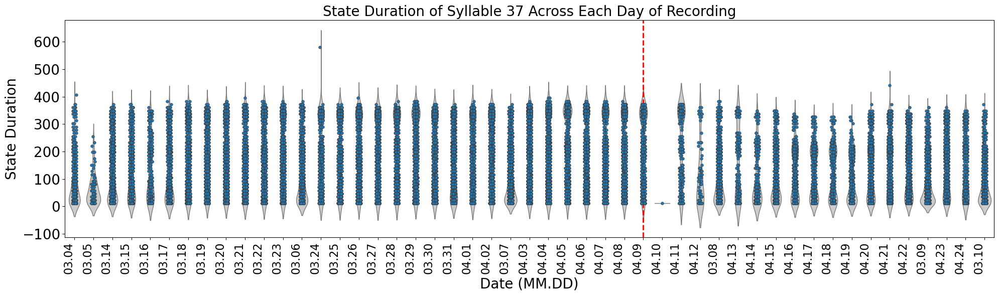

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


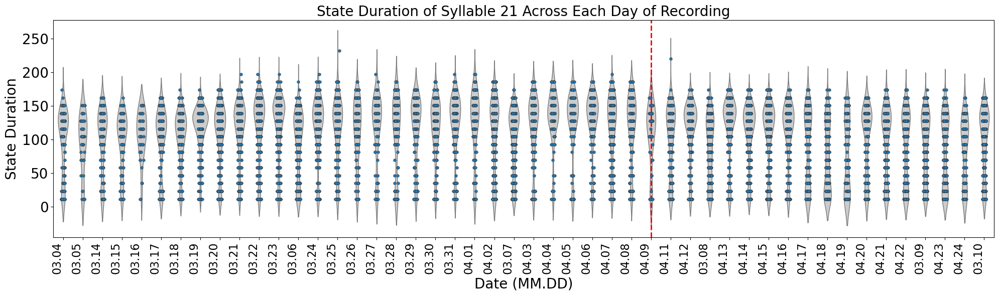

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


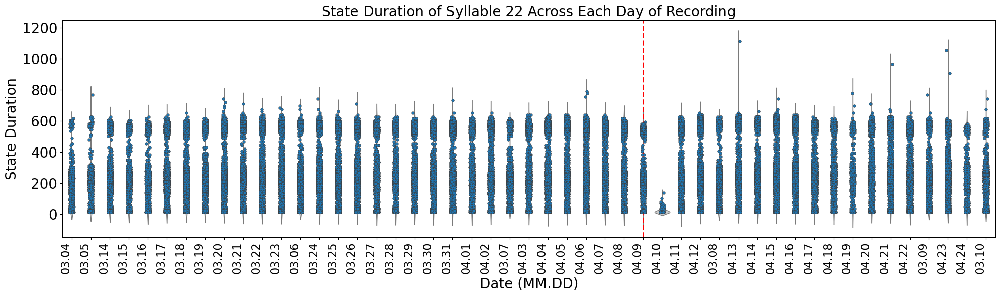

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


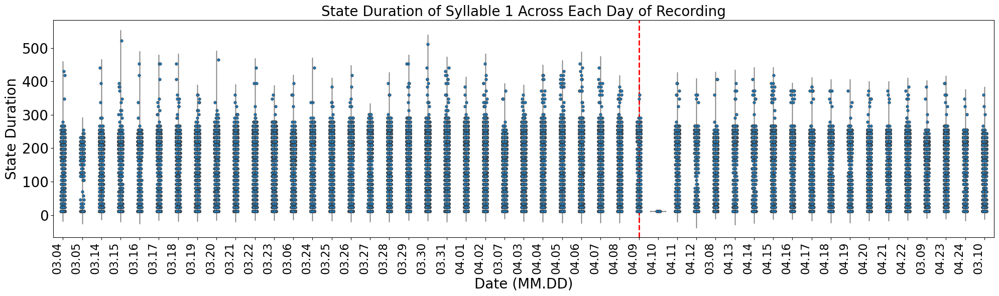

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


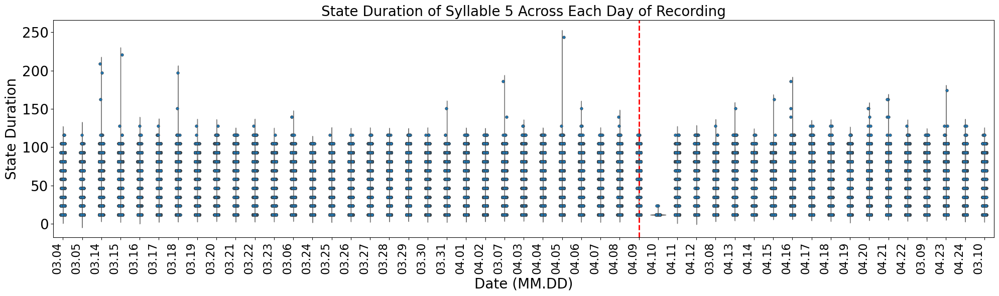

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


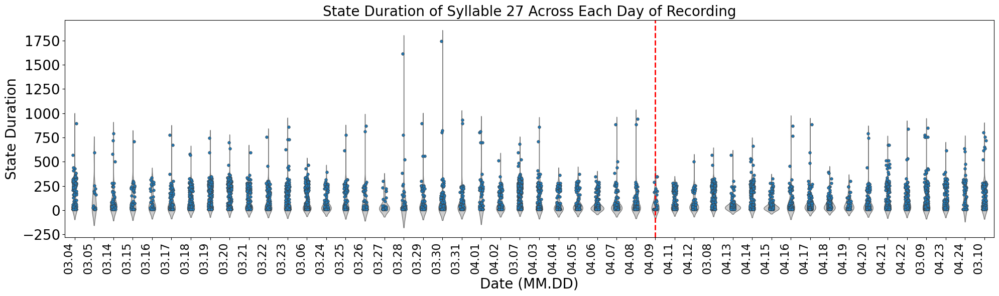

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


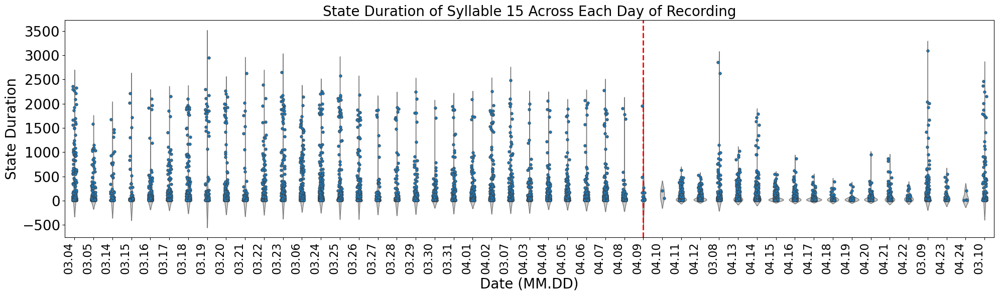

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


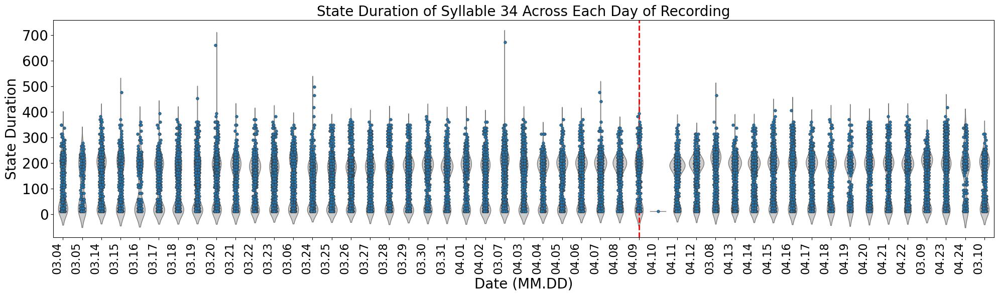

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


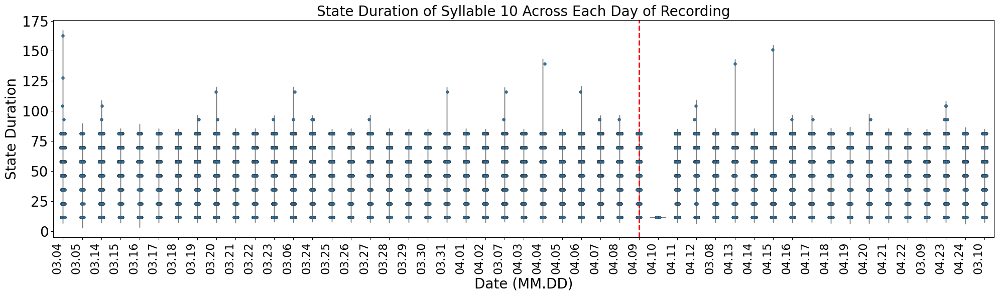

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


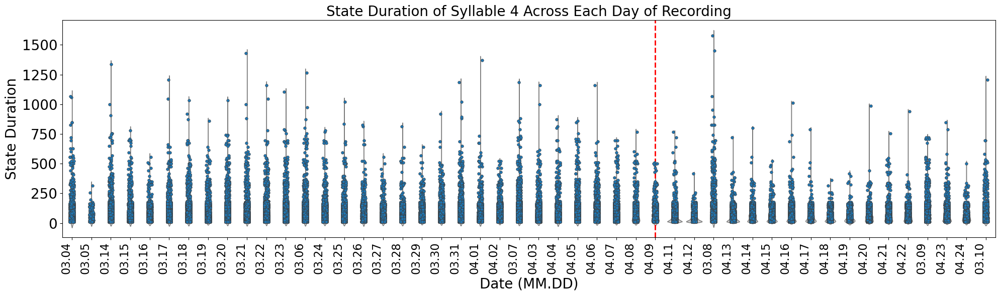

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


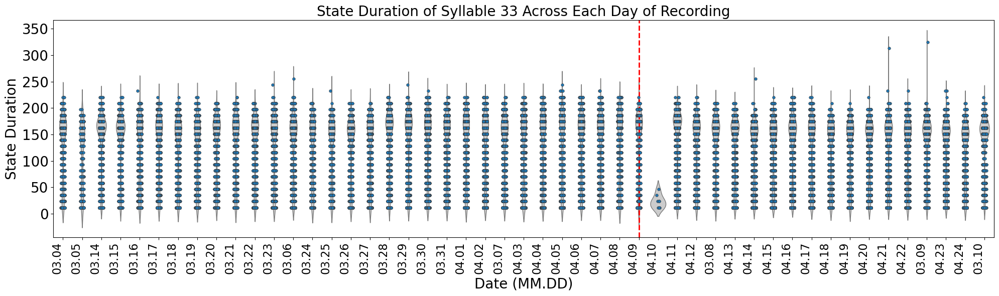

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


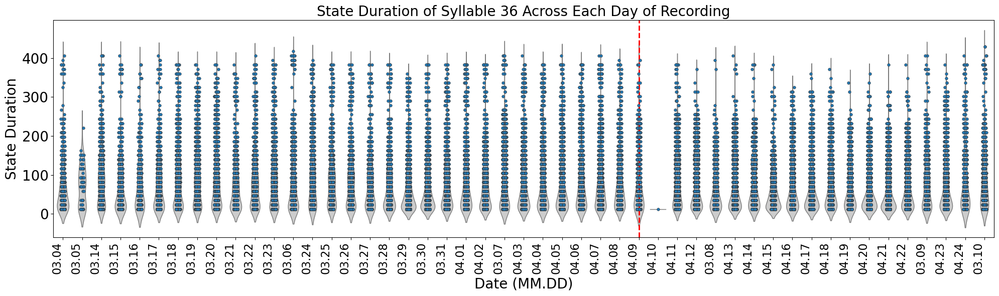

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


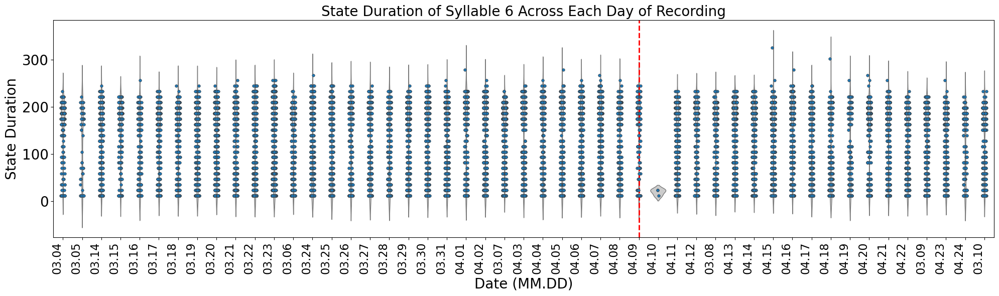

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


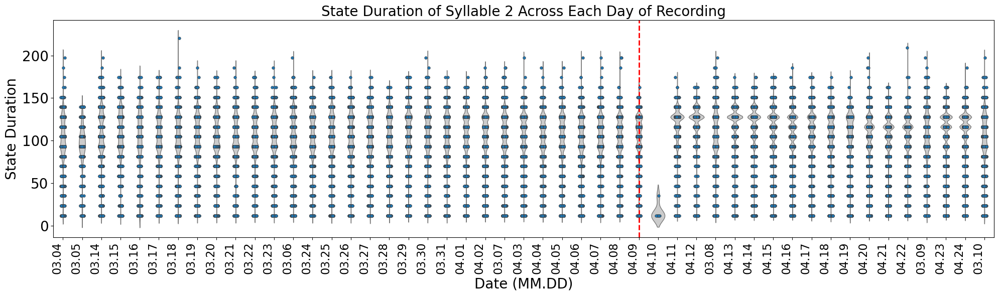

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


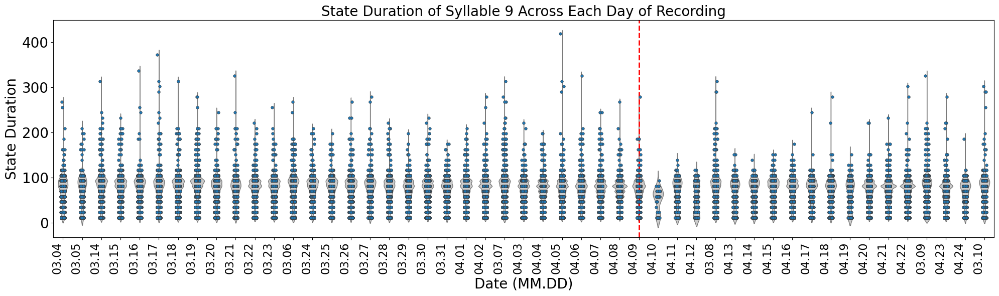

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


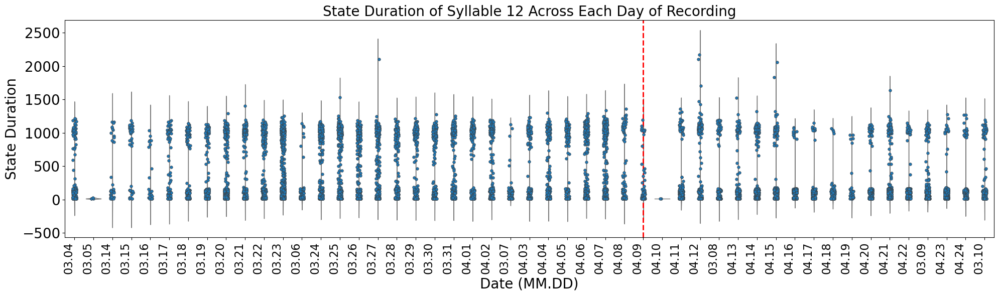

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


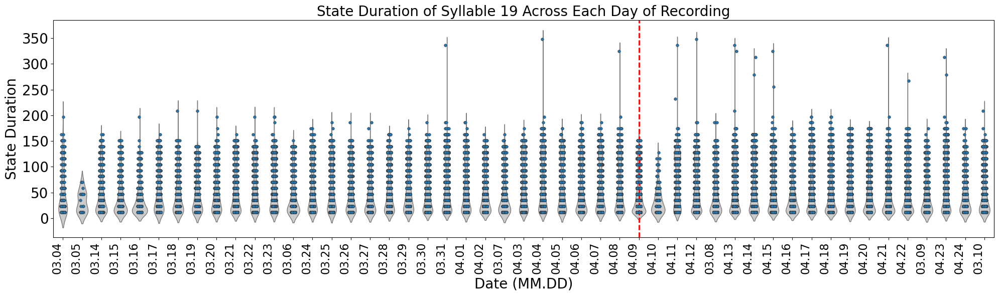

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


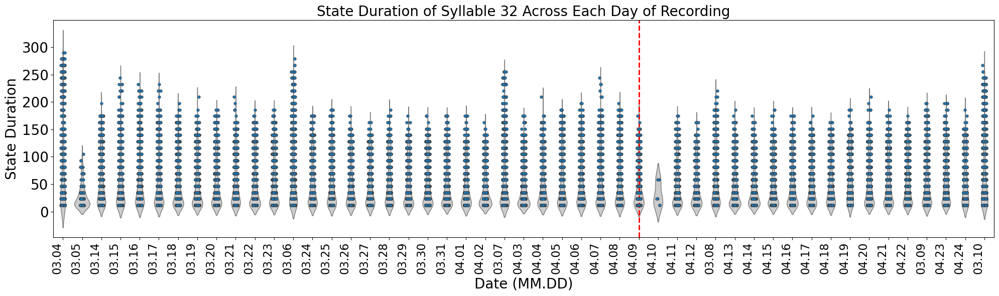

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


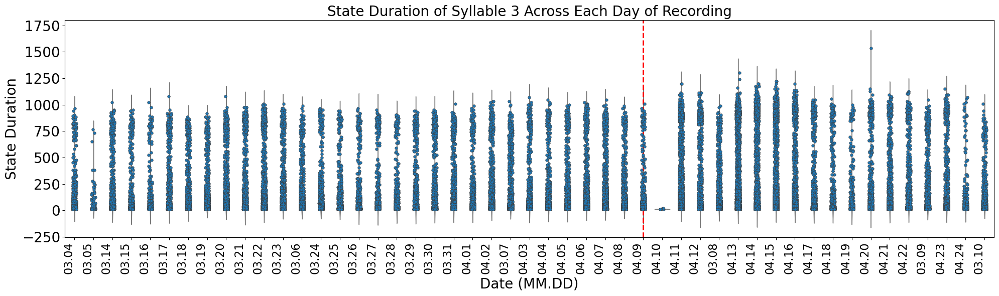

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


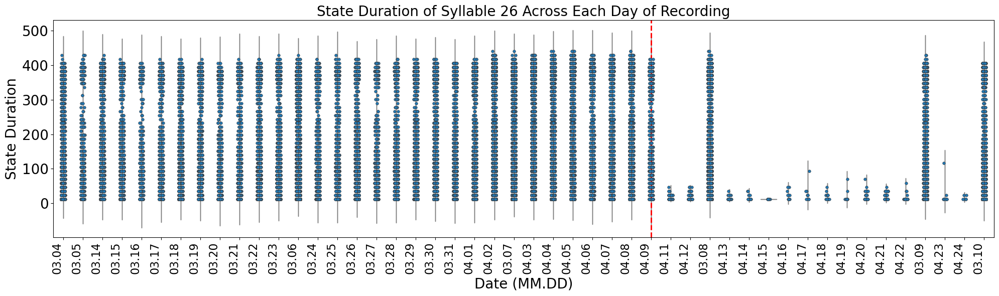

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


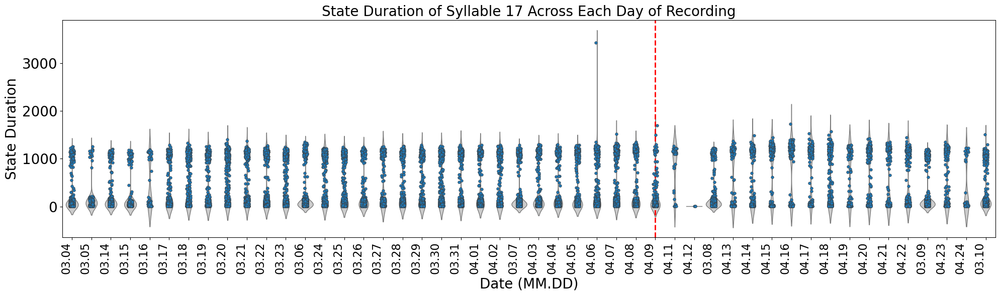

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


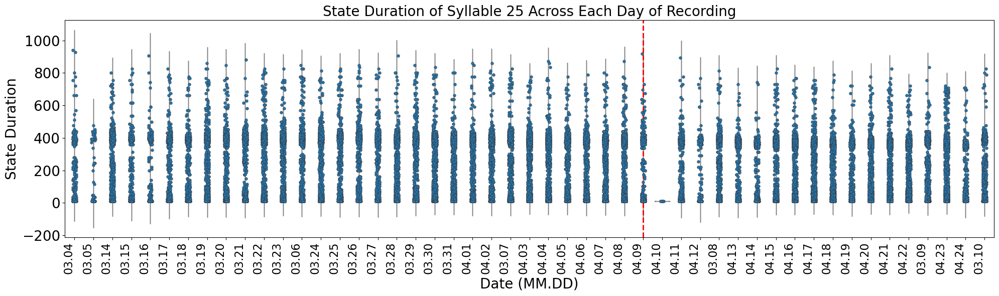

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


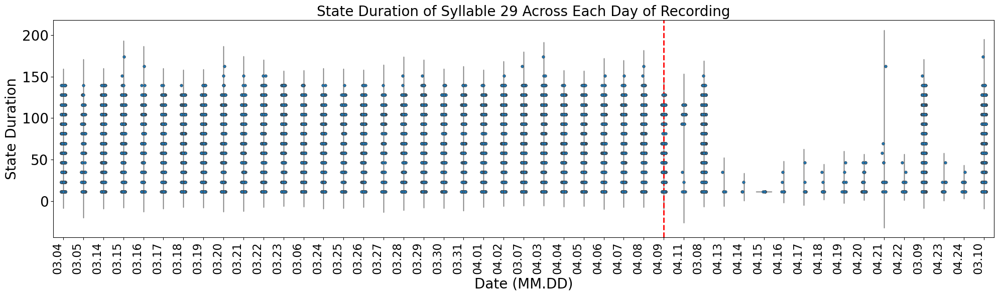

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


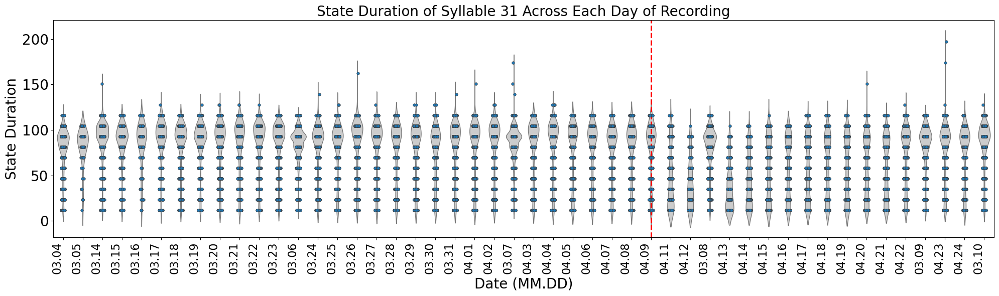

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


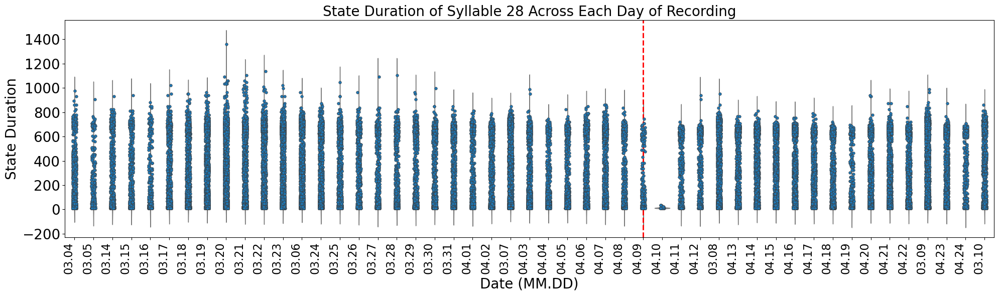

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


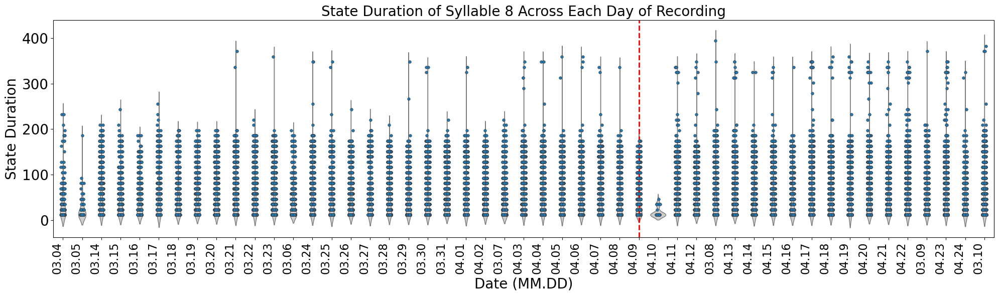

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


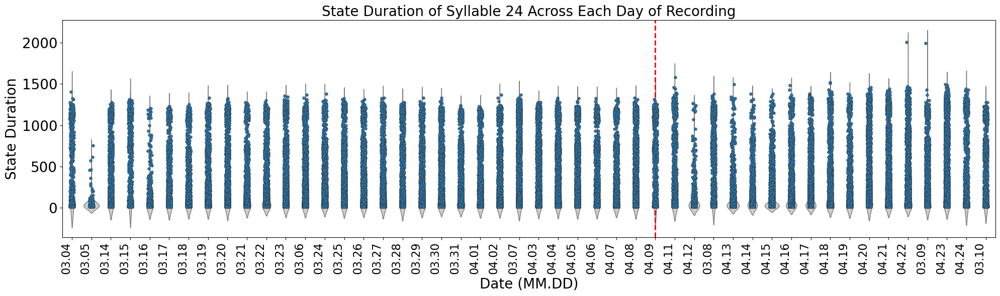

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


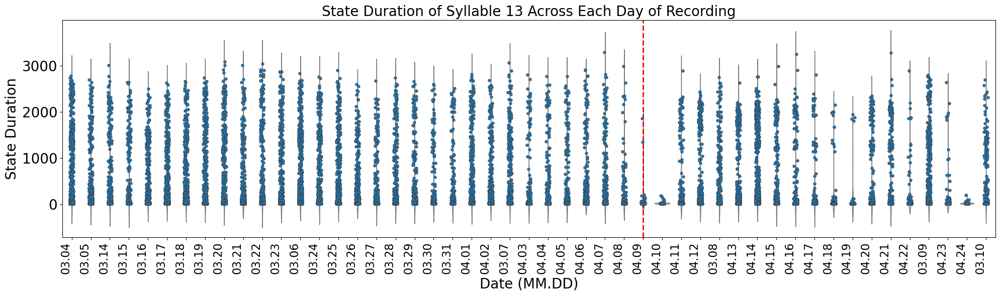

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


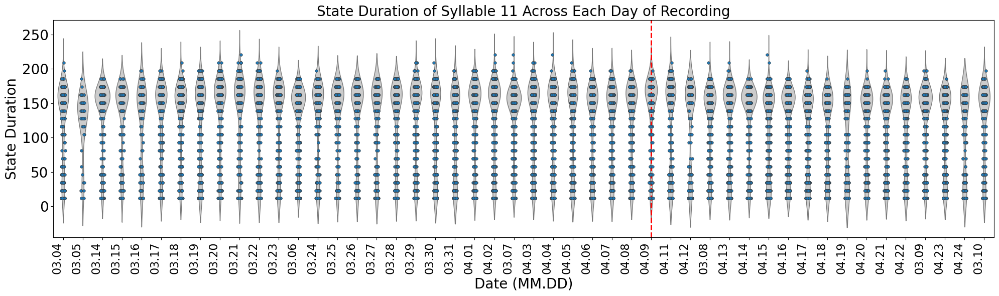

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


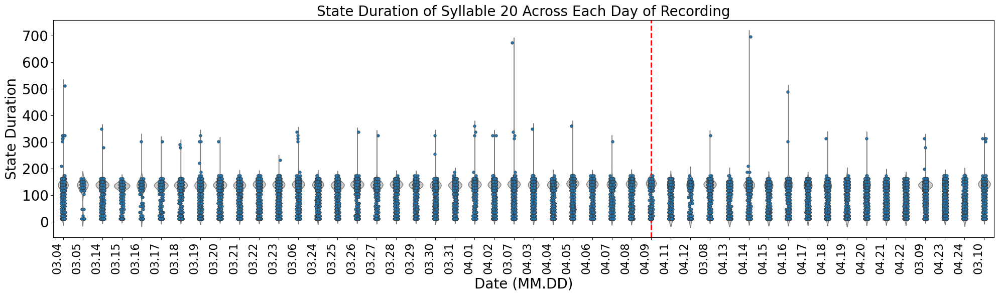

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


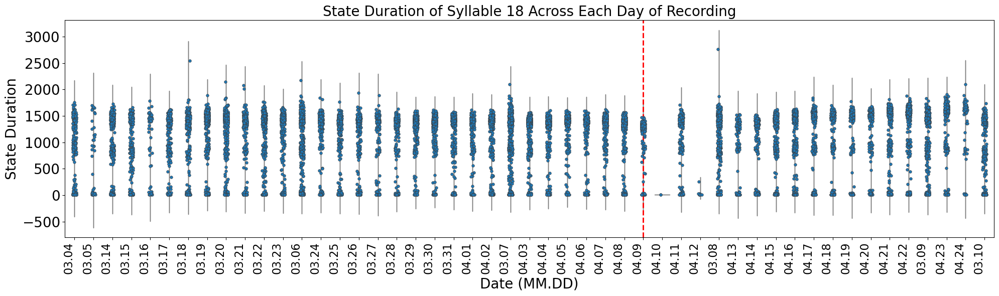

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


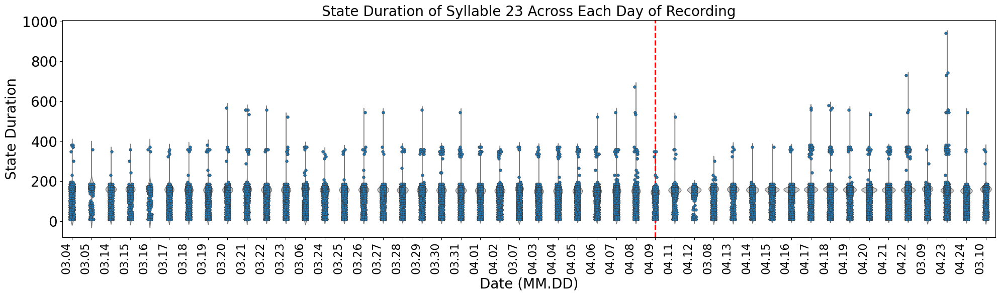

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


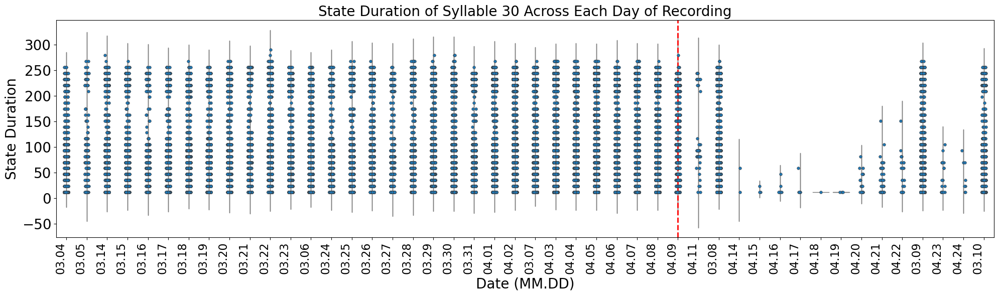

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


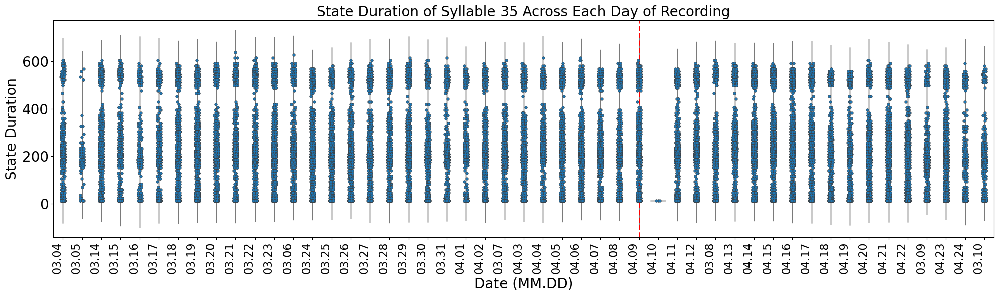

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


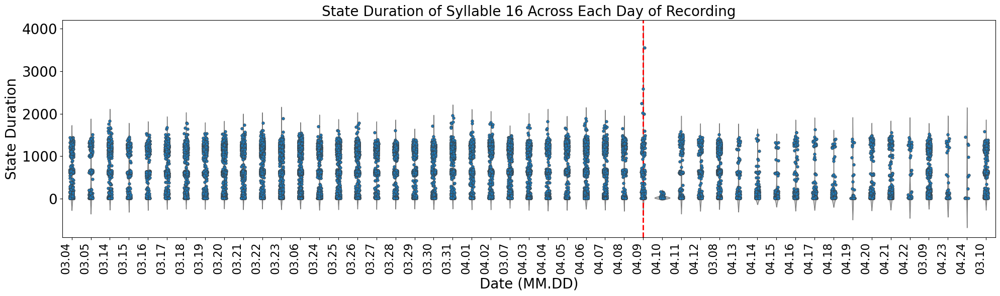

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


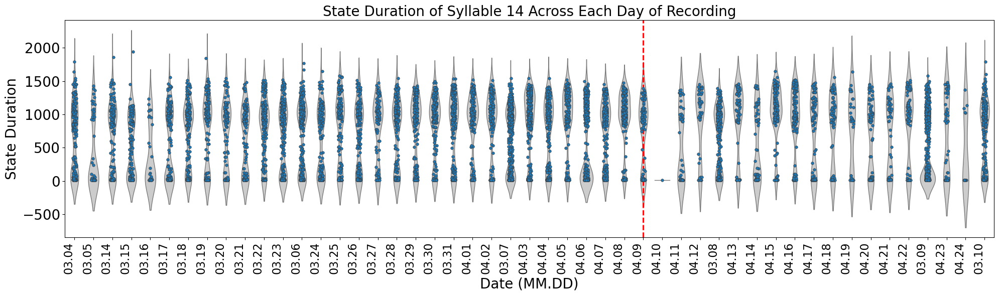

/var/folders/f4/1h7zvz4d1fxc5m8g17h70mfm0000gn/T/ipykernel_32783/271068645.py:25: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)


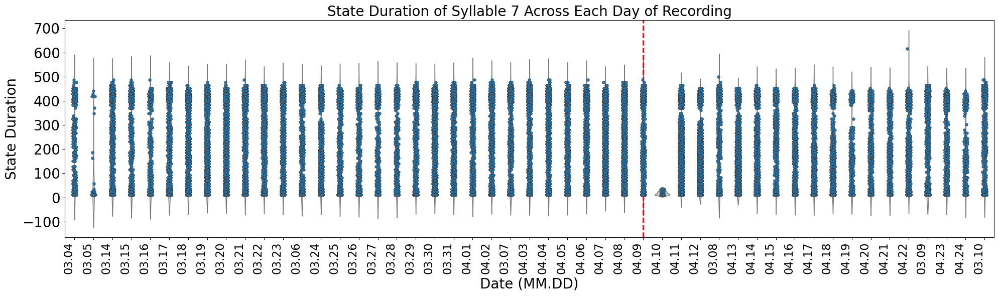

In [6]:
## Code for iterative  graphing
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_syllable_durations(syllable_durations_by_date):
    for each_syllable, durations_by_date in syllable_durations_by_date.items():
        # Prepare data for the plot
        data = []

        for date, durations in durations_by_date.items():
            for duration in durations:
                data.append({"Date": date, "Syllable Duration": duration})

        # Convert the list of dictionaries to a DataFrame
        df = pd.DataFrame(data)

        # Create the plot for the current syllable
        plt.figure(figsize=(20, 6))

        # Violin plot on the left half
        sns.violinplot(x="Date", y="Syllable Duration", data=df, inner=None, color=".8", linewidth=1)

        # Strip plot on the right half
        sns.stripplot(x="Date", y="Syllable Duration", data=df, size=4, jitter=True, edgecolor="gray", linewidth=0.5)

        # Customize the plot
        plt.xticks(rotation=90, ha='right', fontsize=16)
        plt.yticks(fontsize=20)
        plt.xlabel('Date (MM.DD)', fontsize=20)
        plt.ylabel('State Duration', fontsize=20)
        plt.title(f'State Duration of Syllable {each_syllable} Across Each Day of Recording', fontsize=20)
        
        # Example of adding a vertical line at a specific date, adjust as necessary
        plt.axvline(x='04.09', color='red', linestyle='--', linewidth=2, label='Day of lesion')

        # Show the plot
        plt.tight_layout()
        plt.show()

# Example usage
plot_syllable_durations(syllable_durations_by_date)

